# Reinforcement Learning for the Pendulum-v1 Environment

This notebook demonstrates the implementation and comparison of three reinforcement learning algorithms:
1. Monte Carlo
2. SARSA (State-Action-Reward-State-Action)
3. Q-Learning

We'll visualize the learning process and compare their performance on the Pendulum-v1 environment.

In [2]:
# Install necessary packages if not already installed
!pip install gymnasium matplotlib numpy seaborn ipywidgets


[notice] A new release of pip is available: 25.0 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gymnasium as gym
from IPython.display import display, HTML

# Import our custom modules
from rl_algorithms import ReinforcementLearningAlgorithm, MonteCarloRL, SarsaRL, QLearningRL
from pendulum_visualization import PendulumVisualizer

# Set plot style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

## 1. Train the Algorithms

First, let's train our three reinforcement learning algorithms on the Pendulum-v1 environment.

In [4]:
# Hyperparameters
gamma = 0.99  # Discount factor
epsilon = 0.1  # Exploration rate
alpha = 0.1  # Learning rate
n_episodes = 50000  # Number of training episodes

# State discretization (for Pendulum: [cos(θ), sin(θ), θ̇])
state_bins = [10, 10, 10]  

# Action discretization (for Pendulum: torque in [-2, 2])
action_bins = 10

In [5]:
# Create and train the Monte Carlo agent
print("Training Monte Carlo agent...")
mc_agent = MonteCarloRL(
    env_name="Pendulum-v1", 
    gamma=gamma, 
    epsilon=epsilon, 
    state_discretization=state_bins,
    action_discretization=action_bins
)
mc_agent.train(n_episodes=n_episodes)

Training Monte Carlo agent...
Episode 0/50000, Total Reward: -1546.69
Episode 10/50000, Total Reward: -1292.87
Episode 20/50000, Total Reward: -1239.97
Episode 30/50000, Total Reward: -1161.81
Episode 40/50000, Total Reward: -1138.77
Episode 50/50000, Total Reward: -968.14
Episode 60/50000, Total Reward: -1194.49
Episode 70/50000, Total Reward: -978.70
Episode 80/50000, Total Reward: -854.95
Episode 90/50000, Total Reward: -980.08
Episode 100/50000, Total Reward: -947.23
Episode 110/50000, Total Reward: -1225.65
Episode 120/50000, Total Reward: -969.87
Episode 130/50000, Total Reward: -765.49
Episode 140/50000, Total Reward: -746.16
Episode 150/50000, Total Reward: -891.56
Episode 160/50000, Total Reward: -866.72
Episode 170/50000, Total Reward: -1657.85
Episode 180/50000, Total Reward: -1078.75
Episode 190/50000, Total Reward: -1014.39
Episode 200/50000, Total Reward: -1339.04
Episode 210/50000, Total Reward: -791.26
Episode 220/50000, Total Reward: -747.96
Episode 230/50000, Total Re

(array([[[[   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          ...,
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ]],
 
         [[   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.       

In [6]:
# Create and train the SARSA agent
print("Training SARSA agent...")
sarsa_agent = SarsaRL(
    env_name="Pendulum-v1", 
    gamma=gamma, 
    epsilon=epsilon, 
    alpha=alpha,
    state_discretization=state_bins,
    action_discretization=action_bins
)
sarsa_agent.train(n_episodes=n_episodes)

Training SARSA agent...
Episode 0/50000, Total Reward: -1369.79
Episode 10/50000, Total Reward: -1162.97
Episode 20/50000, Total Reward: -759.25
Episode 30/50000, Total Reward: -967.40
Episode 40/50000, Total Reward: -1076.01
Episode 50/50000, Total Reward: -1177.06
Episode 60/50000, Total Reward: -1185.54
Episode 70/50000, Total Reward: -1273.95
Episode 80/50000, Total Reward: -1280.46
Episode 90/50000, Total Reward: -976.92
Episode 100/50000, Total Reward: -1543.64
Episode 110/50000, Total Reward: -1315.89
Episode 120/50000, Total Reward: -995.71
Episode 130/50000, Total Reward: -972.76
Episode 140/50000, Total Reward: -1365.36
Episode 150/50000, Total Reward: -889.48
Episode 160/50000, Total Reward: -999.75
Episode 170/50000, Total Reward: -946.01
Episode 180/50000, Total Reward: -881.70
Episode 190/50000, Total Reward: -1598.78
Episode 200/50000, Total Reward: -842.10
Episode 210/50000, Total Reward: -1343.42
Episode 220/50000, Total Reward: -1619.05
Episode 230/50000, Total Reward

(array([[[[   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          ...,
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ]],
 
         [[   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.        ,    0.        , ...,
              0.        ,    0.        ,    0.        ],
          [   0.        ,    0.       

In [ ]:
# Create and train the Q-Learning agent
print("Training Q-Learning agent...")
q_learning_agent = QLearningRL(
    env_name="Pendulum-v1", 
    gamma=gamma, 
    epsilon=epsilon, 
    alpha=alpha,
    state_discretization=state_bins,
    action_discretization=action_bins
)
q_learning_agent.train(n_episodes=n_episodes)

Training Q-Learning agent...
Episode 0/50000, Total Reward: -1383.03
Episode 10/50000, Total Reward: -1222.07
Episode 20/50000, Total Reward: -1217.41
Episode 30/50000, Total Reward: -886.08
Episode 40/50000, Total Reward: -1541.52
Episode 50/50000, Total Reward: -1567.68
Episode 60/50000, Total Reward: -760.26
Episode 70/50000, Total Reward: -1028.82
Episode 80/50000, Total Reward: -1672.05
Episode 90/50000, Total Reward: -1500.86
Episode 100/50000, Total Reward: -895.08
Episode 110/50000, Total Reward: -1771.37
Episode 120/50000, Total Reward: -1218.68
Episode 130/50000, Total Reward: -1388.40
Episode 140/50000, Total Reward: -1419.29
Episode 150/50000, Total Reward: -975.69
Episode 160/50000, Total Reward: -837.96
Episode 170/50000, Total Reward: -1452.44
Episode 180/50000, Total Reward: -1181.34
Episode 190/50000, Total Reward: -1738.41
Episode 200/50000, Total Reward: -886.77
Episode 210/50000, Total Reward: -1336.07
Episode 220/50000, Total Reward: -1030.29
Episode 230/50000, Tot

## 2. Visualize Learning Progress

Let's compare the learning curves of all three algorithms.

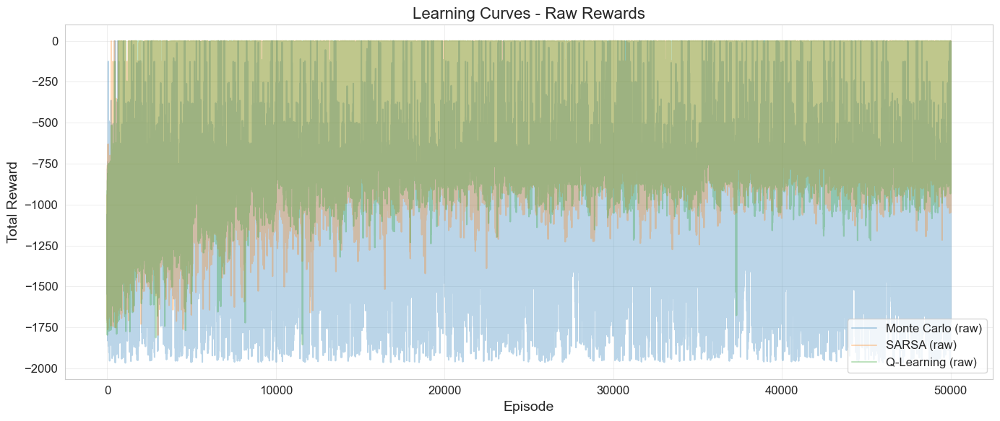

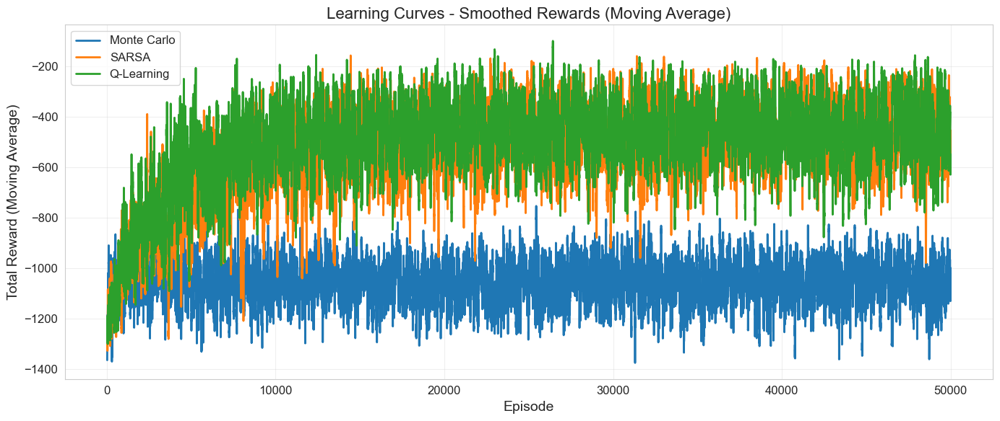

In [10]:
# Plot the learning curves
agents = [mc_agent, sarsa_agent, q_learning_agent]
labels = ["Monte Carlo", "SARSA", "Q-Learning"]

# Plot raw rewards
plt.figure(figsize=(14, 6))
for i, (agent, label) in enumerate(zip(agents, labels)):
    plt.plot(agent.episode_rewards, alpha=0.3, label=f"{label} (raw)")

plt.title("Learning Curves - Raw Rewards", fontsize=16)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Total Reward", fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Plot smoothed rewards
window_size = 20
plt.figure(figsize=(14, 6))
for i, (agent, label) in enumerate(zip(agents, labels)):
    rewards = agent.episode_rewards
    if len(rewards) >= window_size:
        moving_avg = np.convolve(rewards, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(rewards)), moving_avg, label=label, linewidth=2)
    else:
        plt.plot(rewards, label=label, linewidth=2)

plt.title("Learning Curves - Smoothed Rewards (Moving Average)", fontsize=16)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Total Reward (Moving Average)", fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

## 3. Visualize Value Functions

Now let's visualize the learned value functions for each algorithm.

5


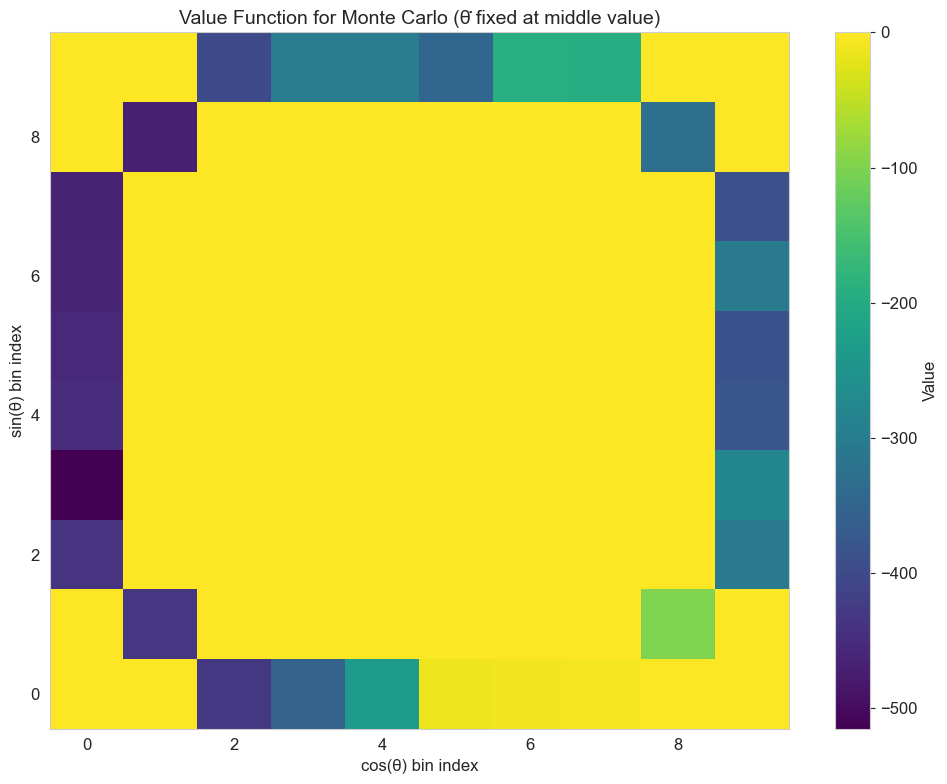

5


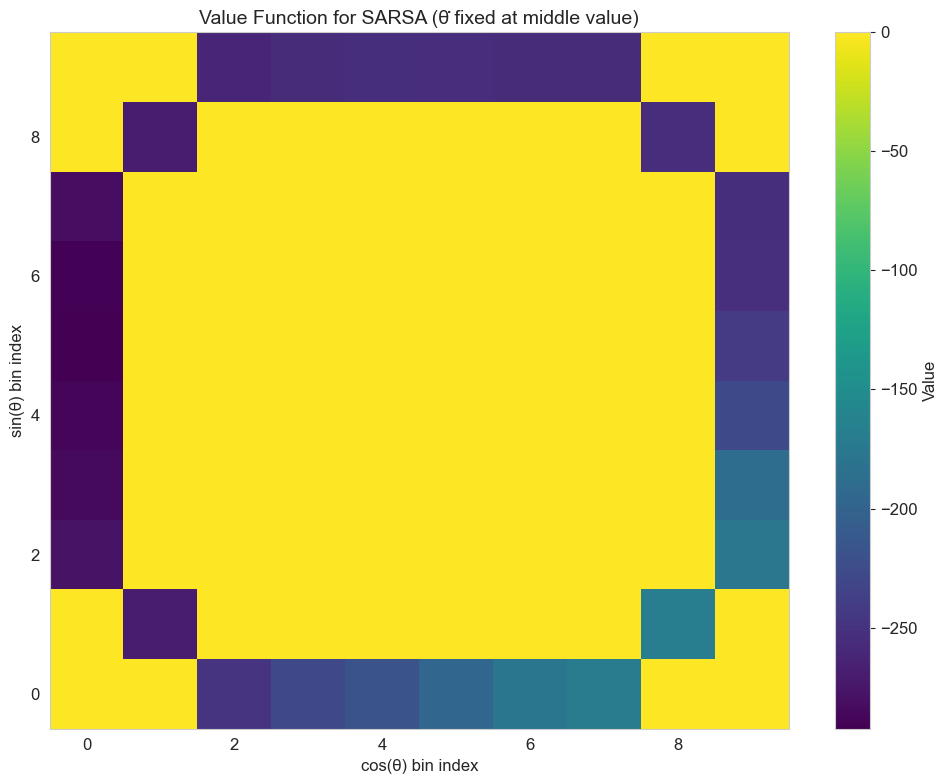

5


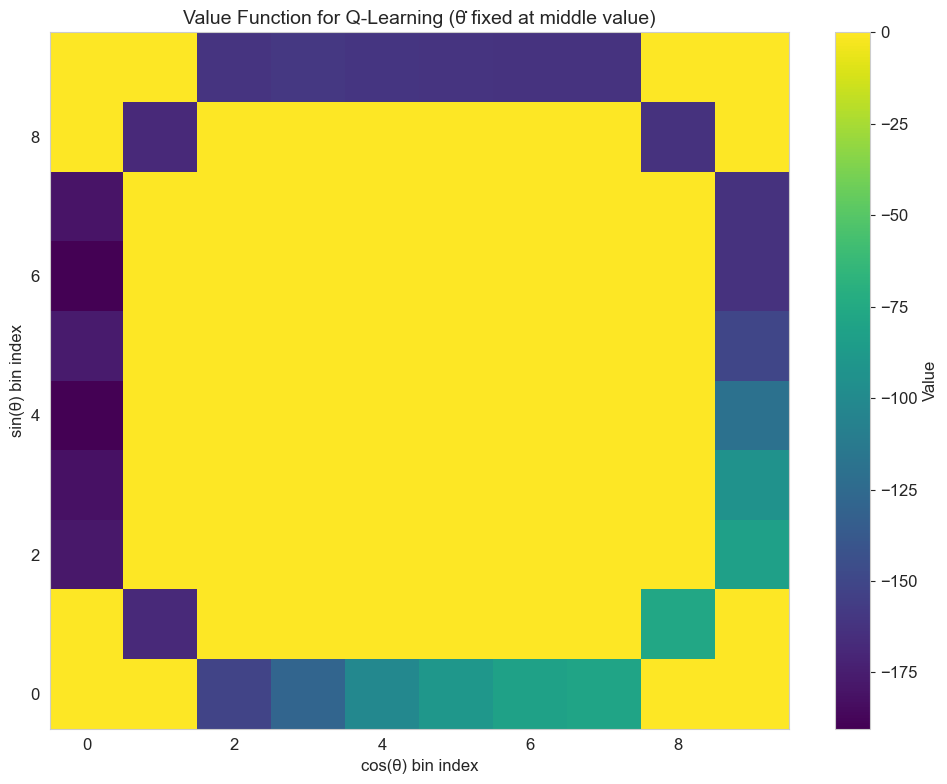

In [29]:
# Visualize value functions for the cos(θ) and sin(θ) dimensions
for agent, title in zip(agents, labels):
    plt.figure(figsize=(10, 8))
    
    # Create a 2D slice of the value function (cos(θ) vs sin(θ))
    cos_indices = np.arange(state_bins[0])
    sin_indices = np.arange(state_bins[1])
    X, Y = np.meshgrid(cos_indices, sin_indices)
    Z = np.zeros_like(X, dtype=float)
    
    # Fixed value for θ̇ (middle of the range)
    #theta_dot_idx = state_bins[2] // 2
    print(state_bins[2] // 2)
    theta_dot_idx = 7
    
    # Extract values from the value table
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = agent.v_table[X[i, j], Y[i, j], theta_dot_idx]
    
    # Plot as a heatmap
    plt.pcolormesh(X, Y, Z, cmap='viridis', shading='auto')
    plt.colorbar(label='Value')
    
    # Add labels
    plt.title(f"Value Function for {title} (θ̇ fixed at middle value)", fontsize=14)
    plt.xlabel("cos(θ) bin index", fontsize=12)
    plt.ylabel("sin(θ) bin index", fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

## 4. Visualize Agent Performance

Let's visualize how each agent performs in the environment.

Monte Carlo Agent Performance:
Episode 1/1, Total Reward: -966.72


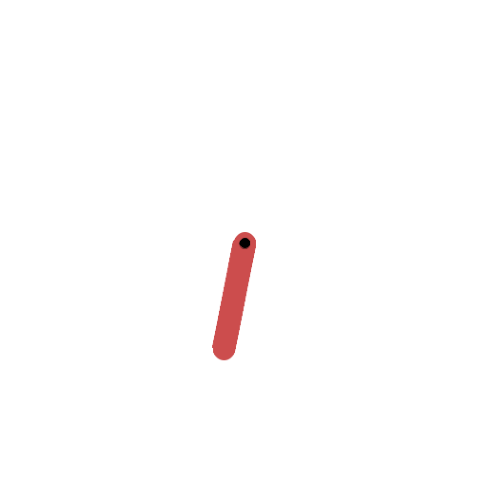

In [20]:
# Visualize individual agents
print("Monte Carlo Agent Performance:")
mc_animation = PendulumVisualizer.visualize_agent(
    mc_agent, max_steps=200, n_episodes=1, fps=30
)
display(mc_animation)

SARSA Agent Performance:
Episode 1/1, Total Reward: -257.78


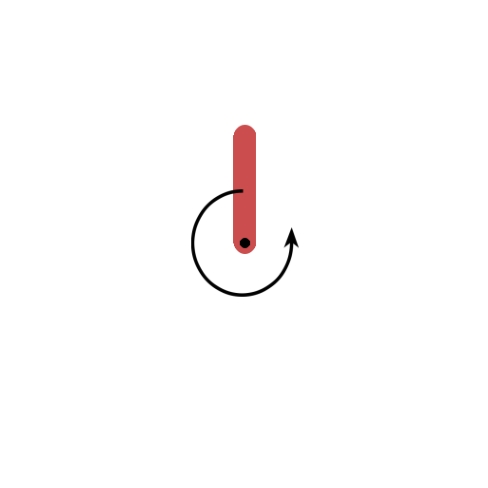

In [21]:
print("SARSA Agent Performance:")
sarsa_animation = PendulumVisualizer.visualize_agent(
    sarsa_agent, max_steps=200, n_episodes=1, fps=30
)
display(sarsa_animation)

Q-Learning Agent Performance:
Episode 1/1, Total Reward: -0.96


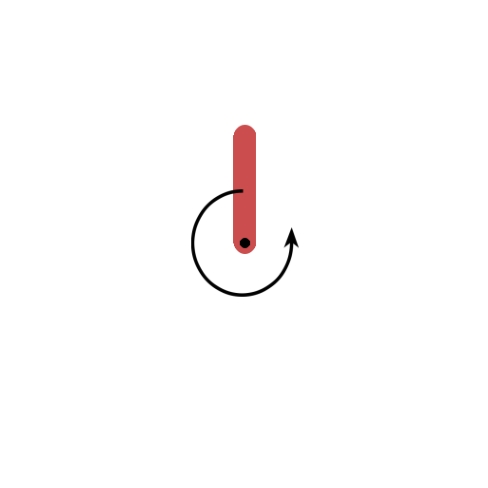

In [22]:
print("Q-Learning Agent Performance:")
q_learning_animation = PendulumVisualizer.visualize_agent(
    q_learning_agent, max_steps=200, n_episodes=1, fps=30
)
display(q_learning_animation)

## 5. Compare All Agents Side-by-Side

Side-by-Side Comparison:
Monte Carlo Total Reward: -1395.79
SARSA Total Reward: -357.69
Q-Learning Total Reward: -126.95


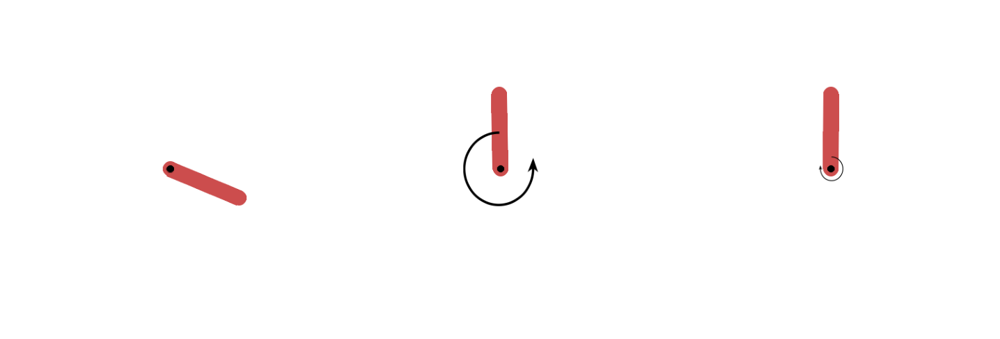

In [23]:
# Compare all agents side by side
print("Side-by-Side Comparison:")
comparison_animation = PendulumVisualizer.compare_agents(
    agents, labels, max_steps=200, fps=30
)
display(comparison_animation)

## 6. Test Agent Performance

Let's run multiple test episodes for each agent and compare their average performance.

Testing agents over 10 episodes each...

Testing Monte Carlo agent:
Test Episode 1/10, Total Reward: -1262.65
Test Episode 2/10, Total Reward: -1303.99
Test Episode 3/10, Total Reward: -1010.19
Test Episode 4/10, Total Reward: -1275.47
Test Episode 5/10, Total Reward: -1538.21
Test Episode 6/10, Total Reward: -1417.62
Test Episode 7/10, Total Reward: -1377.48
Test Episode 8/10, Total Reward: -903.33
Test Episode 9/10, Total Reward: -1040.34
Test Episode 10/10, Total Reward: -1055.25
Average Test Reward: -1218.45

Testing SARSA agent:
Test Episode 1/10, Total Reward: -133.36
Test Episode 2/10, Total Reward: -252.19
Test Episode 3/10, Total Reward: -132.26
Test Episode 4/10, Total Reward: -1.86
Test Episode 5/10, Total Reward: -340.44
Test Episode 6/10, Total Reward: -137.71
Test Episode 7/10, Total Reward: -735.13
Test Episode 8/10, Total Reward: -256.43
Test Episode 9/10, Total Reward: -127.87
Test Episode 10/10, Total Reward: -376.66
Average Test Reward: -249.39

Testing Q-Learning ag

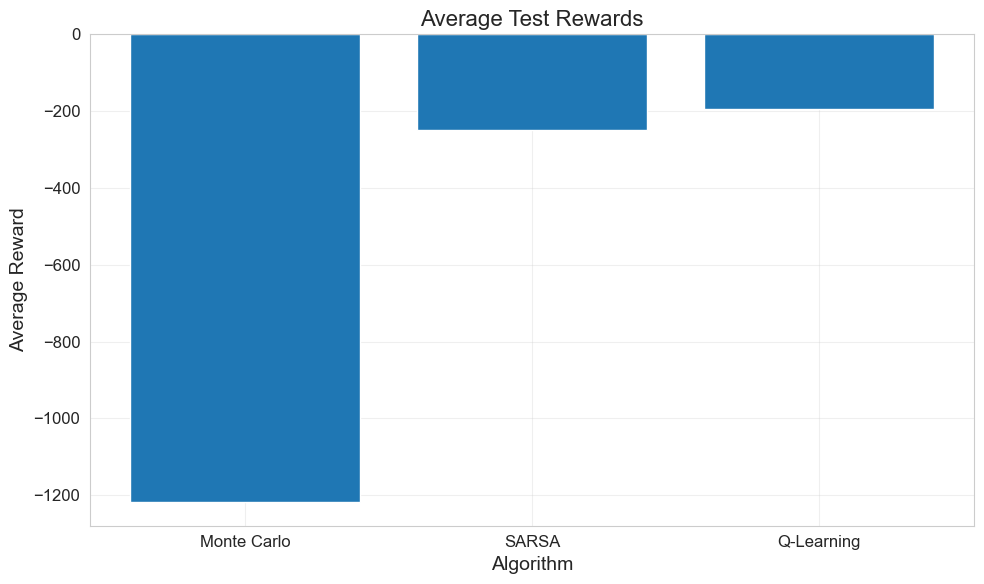

In [26]:
# Test all agents and compare performance
n_test_episodes = 10
print(f"Testing agents over {n_test_episodes} episodes each...")

test_results = []

for agent, label in zip(agents, labels):
    print(f"\nTesting {label} agent:")
    avg_reward = agent.test(n_episodes=n_test_episodes, render=False)
    test_results.append((label, avg_reward))

# Plot results
plt.figure(figsize=(10, 6))
labels = [result[0] for result in test_results]
rewards = [result[1] for result in test_results]

plt.bar(labels, rewards)
plt.title("Average Test Rewards", fontsize=16)
plt.xlabel("Algorithm", fontsize=14)
plt.ylabel("Average Reward", fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Conclusion

We've implemented and compared three classic reinforcement learning algorithms for solving the Pendulum-v1 environment. Each algorithm has its own characteristics:

1. **Monte Carlo**: Learns from complete episodes and updates value estimates based on actual returns.
2. **SARSA**: An on-policy temporal difference method that updates values based on the next state-action pair.
3. **Q-Learning**: An off-policy temporal difference method that updates values based on the best possible next action.

The visualizations help us understand how each algorithm performs and how they differ in their learned value functions and policies.